# Lab Week 18: IIR filters, FFT Windowing, Effects

### 8 March 2017

# Goals #

After doing this lab, you should be able to:
* Use an iir filter design tool to create a filter, then apply it to a sound
* Have hands-on experience using windowing for better FFT analysis and effects
* Understand how STFT can be used to implement effects in the frequency domain

# Part 1: IIR Filter design #

In this section, you will see how to use an IIR filter design tool, and compare it to an FIR filter.

## Loading some sound files ##
a. Start by grabbing the same music files you used in Lab 17. Put them in the same directory as this lab.

* http://www.doc.gold.ac.uk/~mas01rf/PMC2014-15/IPython/lab13/song1.wav
* http://www.doc.gold.ac.uk/~mas01rf/PMC2016-17/lab17/song2.wav

These are free sounds downloaded from

http://freemusicarchive.org/music/Jahzzar/Travellers_Guide/Siesta

and

http://freemusicarchive.org/music/Black_Ant/Free_Beats_Sel_3/Fater_Lee

b. Now load them into variables:

In [1]:
song1 = wavReadMono("Lab15_data/song1.wav")
song2 = wavReadMono("Lab17_data/song2.wav")
#Listen to them if you'd like:
play(song1)
play(song2)

/Users/pesa/anaconda2/lib/python2.7/site-packages/scipy/io/wavfile.py:267: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


## Adding an alarm sound ## 
c. Use the code below (same as last week) to add an "alarm" sound to song1:

In [2]:
#This code adds a 5000Hz sine wave to the first 1 second of song1, then stores it in a new variable:
t = np.arange(0, 1, 1/44100)
song1_5000 = song1[0:44100] + 0.3 * sin(2*pi*5000*t)
play(song1) #normal song
play(song1_5000) #song with alarm

Listen to the normal song, and the song with the alarm added, above. Make sure you can hear the alarm.

## Getting started with the filter design tool ## 
d. The `signal.iirfilter` function will create you a new IIR filter. At minimum, you need to tell it the order of the filter (i.e., how many feedforward and feedback coefficients), and the cutoff frequency (or frequencies, in the case of a bandpass/bandstop filter).

The cutoff frequency is expressed as a proportion of the Nyquist rate. For instance, a cutoff of 0.5 would be 1/2 the Nyquist rate, which would correspond to 11025Hz if you have a sample rate of 44100Hz (and therefore a Nyquist rate of 22050 Hz).

Use the `?` syntax below to read more about this filter design function.

In [3]:
?signal.iirfilter

This function returns two coefficient arrays, b and a. Just like you saw in lecture, b contains the feedforward coefficients, and a contains the feedback coefficients. 

For example, the following code creates a highpass filter with order 10, with a cutoff at 0.3 times the Nyquist frequency. Then it prints out the coefficients.

In [4]:
b, a = signal.iirfilter(10, 0.3, btype='high')
print
print "b is ", b
print "a is ", a


b is  [  0.04206696  -0.42066963   1.89301335  -5.0480356    8.83406231
 -10.60087477   8.83406231  -5.0480356    1.89301335  -0.42066963
   0.04206696]
a is  [  1.00000000e+00  -3.98765437e+00   8.09440659e+00  -1.04762754e+01
   9.42333716e+00  -6.08421408e+00   2.83526165e+00  -9.36403463e-01
   2.08912325e-01  -2.83358587e-02   1.76963187e-03]


In [5]:
# Return arrays for fwd and bwd coefficients of bandpass filter of type butterworth (default type)
myB_1, myA_1 = signal.iirfilter(10, [0.25, 0.28], btype = 'band')
print
print "b is ", myB_1
print "a is ", myA_1


b is  [  4.02474647e-14   0.00000000e+00  -4.02474647e-13   0.00000000e+00
   1.81113591e-12   0.00000000e+00  -4.82969577e-12   0.00000000e+00
   8.45196759e-12   0.00000000e+00  -1.01423611e-11   0.00000000e+00
   8.45196759e-12   0.00000000e+00  -4.82969577e-12   0.00000000e+00
   1.81113591e-12   0.00000000e+00  -4.02474647e-13   0.00000000e+00
   4.02474647e-14]
a is  [  1.00000000e+00  -1.30692960e+01   8.62682850e+01  -3.78520548e+02
   1.23096089e+03  -3.14151428e+03   6.51056446e+03  -1.11980064e+04
   1.62124662e+04  -1.99349059e+04   2.09209180e+04  -1.87687895e+04
   1.43712019e+04  -9.34558283e+03   5.11570690e+03  -2.32405835e+03
   8.57379265e+02  -2.48221242e+02   5.32625598e+01  -7.59707150e+00
   5.47295171e-01]


Note that you can copy these coefficients into your own code in any environment, and use the IIR filter equation to compute your filter!

But first you probably want to look at the frequency response to see what it looks like.

The `signal.freqz` function below computes the frequency response for frequencies from 0 to the Nyquist. It stores the frequency response in h and the frequencies in w:

In [6]:
w, h = signal.freqz(b, a)

Let's define a function to plot the response, and we can re-use this function later:

In [7]:
def plotResponse(w, h):
    fig = plt.figure()
    plt.title('Digital filter frequency response')
    ax1 = fig.add_subplot(111)

    plt.plot(w, 20 * np.log10(abs(h)), 'b') #plot in dB scale, wow!
    plt.ylabel('Amplitude [dB]', color='b')
    plt.xlabel('Frequency [rad/sample]')

    ax2 = ax1.twinx()
    angles = np.unwrap(np.angle(h))
    plt.plot(w, angles, 'g')
    plt.ylabel('Angle (radians)', color='g')
    plt.grid()
    plt.axis('tight')
    plt.show()

Finally, let's plot the response, using w and h:

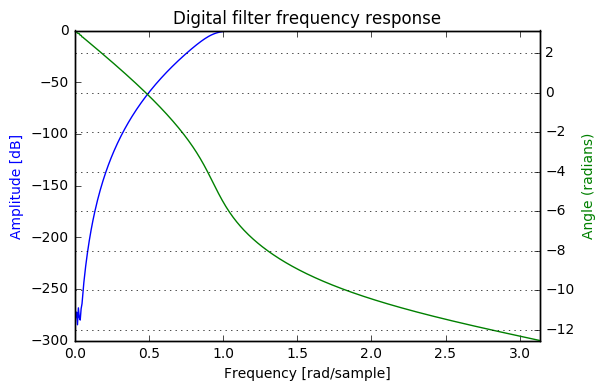

In [8]:
plotResponse(w,h)

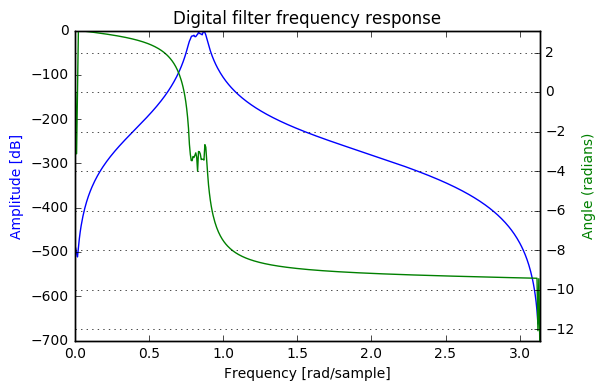

In [9]:
myW_1, myH_1 = signal.freqz(myB_1, myA_1)
plotResponse(myW_1, myH_1)

In order to apply this filter to a sound, you can use the lfilter function:

In [10]:
original_sound = song1
filtered_sound = signal.lfilter(b, a, original_sound) #make sure you load a sound in original_sound first!
play(filtered_sound)

## Using the filter design tool ##

e. Now, use the space below to create a filter to filter out the alarm sound from `song1_5000`. Use visual inspection of the frequency response and your ears to figure out what a good filter will be.

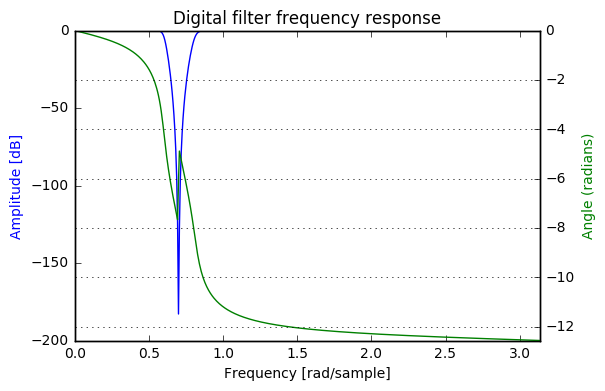

In [11]:
#load 
antiAlarm_b, antiAlarm_a = signal.iirfilter(5, [0.19, 0.26], btype = 'bandstop')
myW_2, myH_2 = signal.freqz(antiAlarm_b, antiAlarm_a)
plotResponse(myW_2, myH_2)

/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


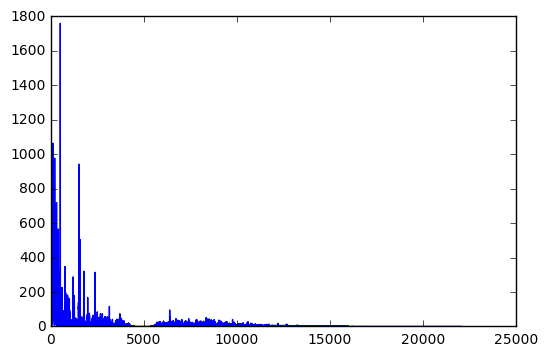

In [12]:
noAlarm = signal.lfilter(antiAlarm_b, antiAlarm_a, song1_5000)
play(noAlarm)
plot(abs(fft.fft(noAlarm))[0:size(noAlarm)/2])

## Reflections ##

How does this IIR filter compare to the FIR filter you made in last week's lab? How many coefficients do you need to remove the alarm sound? Is it more or less than the FIR filter? How much delay is introduced?

 ### Type your reflections here.
 
 The IIR filter has a weirder frequency response, but it requires WAY less coefficients to remove the alarm sound (see below for a comparison). In particular I used 5 coefficients for the IIR and 1001 for the FIR last week -and I would likely need more than 100 if I wanted a fast enough frequency response
 There is less delay introduced because of the limited number of coefficients: we get a sharper response with less coefficients

In [13]:
def plotFirResponse(myCoeffs):
    w, h = signal.freqz(myCoeffs) #get frequency response for h
    fig = plt.figure()
    plt.title('Digital filter frequency response')
    ax1 = fig.add_subplot(111)

    plt.plot(w, 20 * np.log10(abs(h)), 'b') #plot in dB scale, wow!
    plt.ylabel('Amplitude [dB]', color='b')
    plt.xlabel('Frequency [rad/sample]')

    ax2 = ax1.twinx()
    angles = np.unwrap(np.angle(h))
    plt.plot(w, angles, 'g')
    plt.ylabel('Angle (radians)', color='g')
    plt.grid()
    plt.axis('tight')
    plt.show()

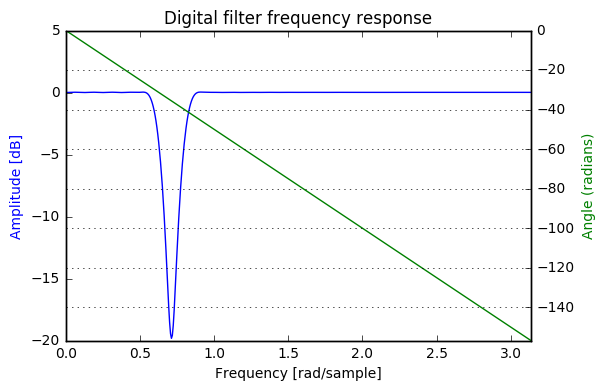

In [14]:
firEg = signal.firwin(101, [4500/22050, 5500/22050]) # Band-stop filter coefficients (from help file for signal.firwin)
plotFirResponse(firEg)

# Part 2: FFT and Windows #

Recall from lecture:

1. When you select a finite number of audio samples and take the FFT, you are implicitly applying a *rectangular window* to these samples. That is, you are multiplying your audio by a signal whose value is 0 for a while, then 1 for a while, then 0 for a while.
2. When you multiply two signals in the time domain, this is equivalent to convolving them in the frequency domain.
3. The spectrum of the rectangular window is ugly and bumpy (i.e., it has high side lobes). This will lead to the FFT of your windowed sound having bumps as well, making your FFT harder to interpret.
4. Therfore, we can get better results by multiplying the sound to be analysed with another type of window, whose spectrum is "nicer."

The functions below can be used to generate "nice" windows of any length. Read their help files:


In [15]:
?np.hamming

In [16]:
?np.hanning

In [17]:
?np.blackman

Use these functions to create three window of 1024 samples each. Then plot each window to take a look at the function that is generated. How do they compare?

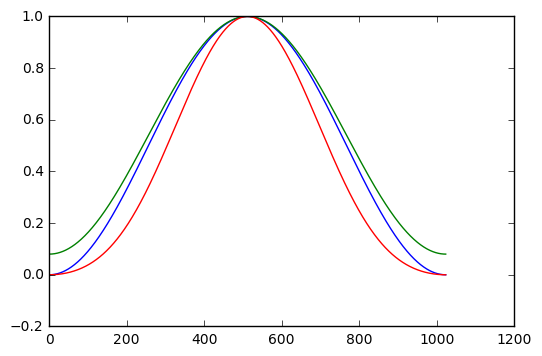

In [18]:
han = np.hanning(1024)
ham = np.hamming(1024)
black = np.blackman(1024)

plot(han)
plot(ham)
plot(black)

#All of them have a bell shape. The Hanning curve is the gentler and it does not start or end at 0 (just above).
#The Hamming and the Blackman both start at zero, with the first rising quicker and the second one having a more pointy shape

Create two 1-second sine wave sampled at 100 Hz. The first sine should have a frequency which will exactly match a frequency bin of a 100-point FFT. The second should have a frequency which will *not* exactly match a frequency bin.

(Recall that a 100-point FFT will give you 100 bins. The frequency of the first bin is 0, and the bins evenly divide the frequency space from 0 to the sampling rate into 100 bins.)

In [19]:
?arange

20.0


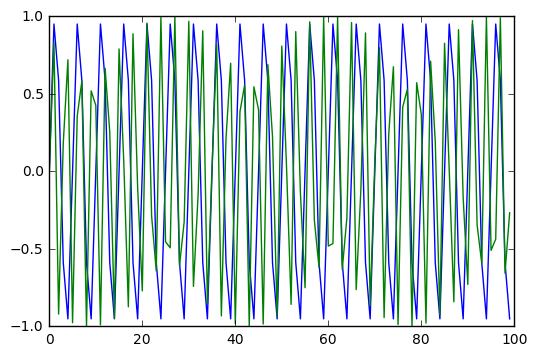

In [20]:
t = arange(0, 1, 1/100)

f = fft.fftfreq(100, 1/100)[20]
print f
s1 = sin(t*f*2*pi)#your first sine wave
s2 = sin(t*(f+14.3)*2*pi)#your second sine wave
plot(s1)
plot(s2)

Plot the FFT of s1 and s2. How do their shapes compare?

/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':
/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


<Container object of 3 artists>

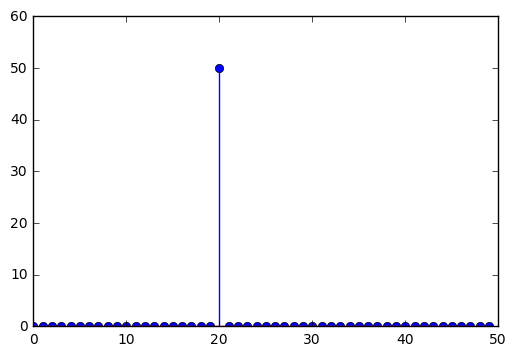

In [21]:
specs1 = abs(fft.fft(s1)[0:size(s1)/2])
specs2 = abs(fft.fft(s2)[0:size(s2)/2])
stem(specs1)

<Container object of 3 artists>

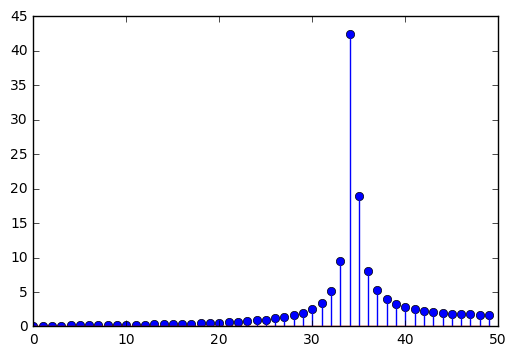

In [22]:
stem(specs2)

Now, use the following code to apply a 100-point Hamming window to s2, and plot it:

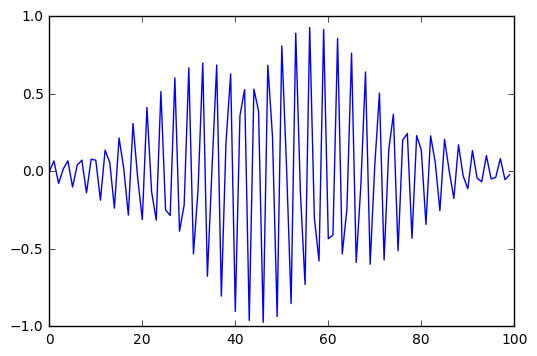

In [23]:
s2_windowed = np.hamming(100)*s2
plot(s2_windowed)

Now plot the FFT of s2_windowed. How does it compare to the FFT of s2?

/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


<Container object of 3 artists>

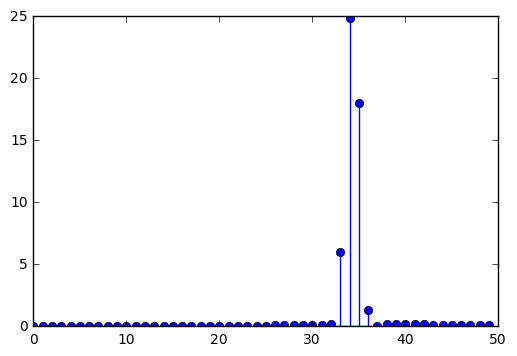

In [25]:
winspecs2 = abs(fft.fft(s2_windowed)[0:size(s2_windowed)/2])
stem(winspecs2)

Comparison: the windowed sine tone has a much neater FFT graph as there is very little spilling in neighbouring bins (2 of which were bound to have energy in as the sine has a frequency in between them, which cannot be exactly represented by either of them)

Now try computing the FFT of a short snippet of sound from song1 or song2. Compare the FFT with and without windowing. How do they compare?

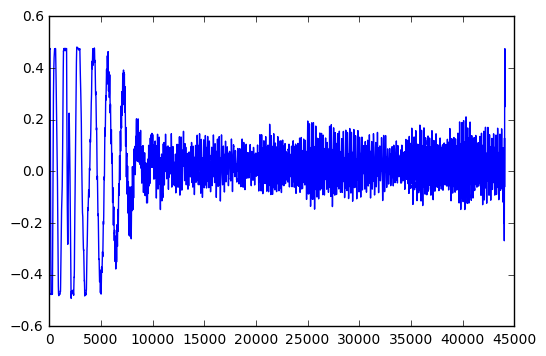

In [39]:
snip = song2[2000: 46100]
plot(snip)

/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


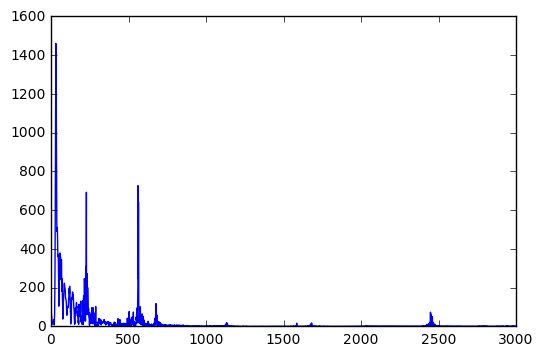

In [40]:
specsnip = abs(fft.fft(snip)[0:size(snip)/2])
plot(specsnip[0:3000])

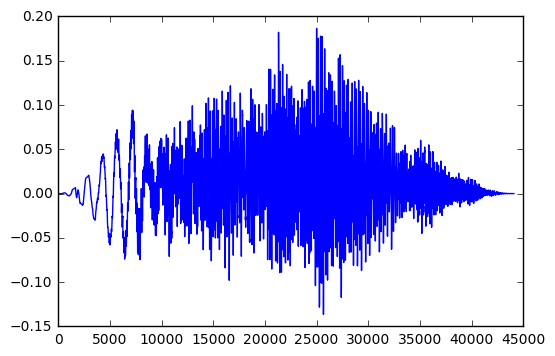

In [43]:
snipwin = np.hanning(44100)*snip
plot(snipwin)

/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


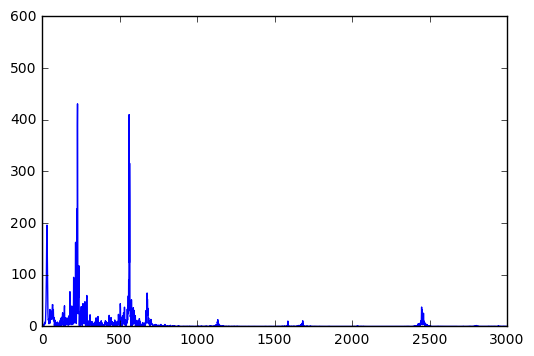

In [44]:
specsnipwin = abs(fft.fft(snipwin)[0:size(snipwin)/2])
plot(specsnipwin[0:3000])

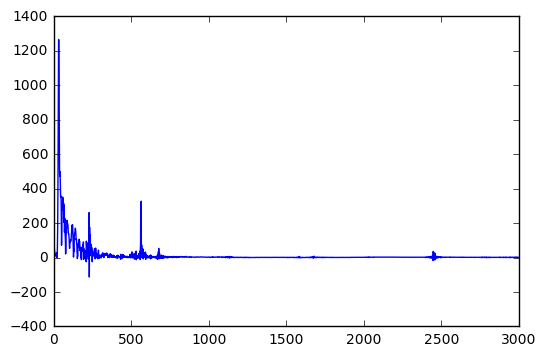

In [47]:
diff = specsnip - specsnipwin
plot(diff[0:3000])

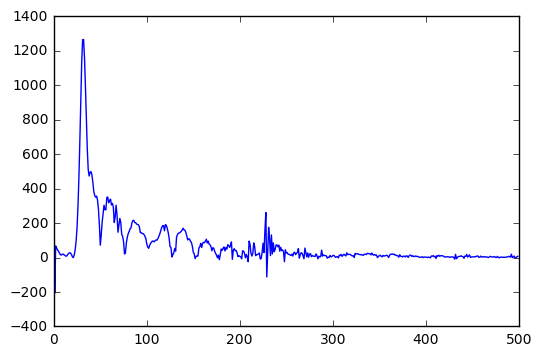

In [48]:
plot(diff[0:500])

Comparison: the windowed snippet has a big reduction in the very low frequencies. I assume this to be an improvement on the analysis by getting rid of unwanted artifacts, since such frequencies are at the very low edge of the human hearing spectrum.

# Part 3: Using the STFT to implement effects #

a. Use Audacity or anothe program to record yourself saying a few words into an audio file, and save this file as "me.wav", in the same directory as this sketch.

Use the code below to load this file into a Python array and play it:


In [50]:
me = wavReadMono("me.wav")
play(me)

The code below performs cross synthesis between your voice and song1. Specifically:

* For each 2048-sample analysis frame in song1:
    * Take an FFT analysis frame from song1, and call this f1
    * Take an FFT analysis frame from song2, and call this f2
    * Compute a new spectrum of the same size, by multiplying each (complex) bin of f1 with the magnitude of the same bin of f2
    * Take the IFFT of this spectrum to produce 2048 samples of audio
    * Add this audio to an audio buffer
    * Then move 16 samples forward in time within song1, within your recording, and within the buffer, repeating the process until you reach the end of the song1 file.


/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:19: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


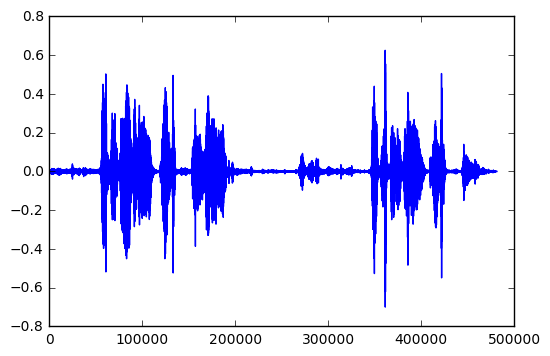

In [51]:
newSound = zeros(size(song1)) #make an audio "buffer" the same length as song1
i = 0 #our index in song1 
j = 0; #our index in "me"
width = 2048; #width of our anlaysis frame
hop = 2048/16; #hop between subsequent frames
win = np.hamming(2048) #our window :) 

while (i+ width < size(song1)) :  #Do this until we get to the end of song1
    if (j + width >= size(me)) : #if we reach the end of "me" first, start at the beginning
        j = 0
    frame1 = win*song1[i:i+width] #select the next 'width' samples from song1 and window them
    frame2 = win*me[j:j+width] #select the next 'width' samples from me and window them
    f1 = fft.fft(frame1) #the next fft of song1 
    f2 = fft.fft(frame2) #the next fft of "me"
    magnitudes = abs(f2) #the magnitudes of "me"
    frame3 = f1 * magnitudes #multiply the complex fft, f1, by the magnitudes of "me", bin by bin
        
    sig1 = fft.ifft(frame3).real #take the inverse FFT to generate audio, and throw away an imaginary garbage, keeping only the real part
    newSound[i:i+width] = newSound[i:i+width] + sig1 #add this to the new sound buffer
    i = i + hop #move to the next analysis location in song1 
    j = j + hop #move to the next analysis location in "me"

newSound = 0.7*newSound/(max(abs(newSound))) #normalise the audio file so it doesn't clip
play(newSound) #play it!
plot(newSound) #plot it!

Make sure you understand the code above. Try changing it! For instance:
* What happens if you use the magnitude of "song1" and the complex FFT of "me" (i.e., switching their roles?)
* Try using two different audio inputs (e.g., two songs, or a voice with white noise, or....)

Think about how you might change this code to make the new sound twice as long, doing time-stretching at the same time.... :)

In [62]:
?concatenate

In [74]:
noise = wavReadMono("Lab15_data/noise.wav")
noise = concatenate([noise, noise, noise])
play(noise)

/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/pesa/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:19: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


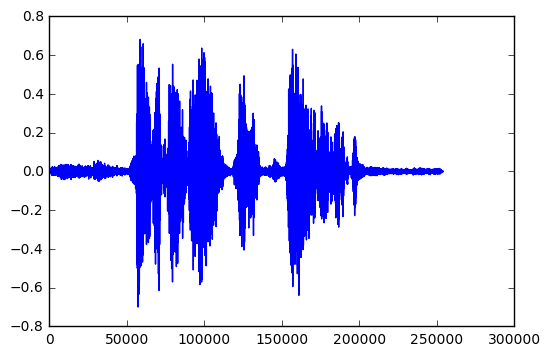

In [93]:
newNewSound = zeros(size(noise)) #make an audio "buffer" the same length as noise
ii = 0 #our index in song1 
jj = 0; #our index in "me"
width2 = 2048; #width of our anlaysis frame
hopp = 2048/16; #hop between subsequent frames
win2 = np.hamming(2048) #our window :) 

while (ii+ width2 < size(noise)) :  #Do this until we get to the end of noise
    if (jj + width2 >= size(me)) : #if we reach the end of "me" first, start at the beginning
        jj = 0
    frame11 = win2*noise[ii:ii+width2] #select the next 'width' samples from noise and window them
    frame22 = win2*me[jj:jj+width2] #select the next 'width' samples from me and window them
    f11 = fft.fft(frame11) #the next fft of noise 
    f22 = fft.fft(frame22) #the next fft of "me"
    magnitudes1 = abs(f22) #the magnitudes of "me"
    frame33 = f11 * magnitudes1 #multiply the complex fft, f11, by the magnitudes of "me", bin by bin
        
    sig11 = fft.ifft(frame33).real #take the inverse FFT to generate audio, and throw away an imaginary garbage, keeping only the real part
    newNewSound[ii:ii+width2] = newNewSound[ii:ii+width2] + sig11 #add this to the new sound buffer
    ii = ii + hopp #move to the next analysis location in noise 
    jj = jj + hopp #move to the next analysis location in "me"

newNewSound = 0.7*newNewSound/(max(abs(newNewSound))) #normalise the audio file so it doesn't clip
play(newNewSound) #play it!
plot(newNewSound) #plot it!



